`cd project/seniorthesis/notebooks`

`conda list PyCO2SYS`

`pip install PyCO2SYS`

`pip install git+https://github.com/jbusecke/cmip6_preprocessing.git`

`mv *.png ../figures`

In [1]:
import xarray as xr
import xesmf as xe
from cmip6_preprocessing.preprocessing import combined_preprocessing
import PyCO2SYS as pyco2 # i have to install this package through terminal for it to work
import intake
import matplotlib.pyplot as plt
import numpy as np
import warnings
import gsw
from cmip6_preprocessing.postprocessing import combine_datasets
from cartopy import crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point
import cmocean
import matplotlib.path as mpath
from cmip6_preprocessing.postprocessing import combine_datasets
from cmip6_preprocessing.postprocessing import merge_variables
from dask.diagnostics import ProgressBar
from xgcm import Grid
from xhistogram.xarray import histogram
import pandas as pd
import scipy

In [2]:
dd = {}
dd['UKESM1-0-LL.gn.historical.Omon'] = xr.open_mfdataset('UKESM1_*_20yr.nc')
dd['CanESM5-CanOE.gn.historical.Omon']= xr.open_mfdataset('CanESM5CanOE*_20yr.nc')
dd['CNRM-ESM2-1.gn.historical.Omon']= xr.open_mfdataset('CNRM*_20yr.nc')
dd['CanESM5.gn.historical.Omon']= xr.open_mfdataset('CanESM5_*_20yr.nc')
dd['IPSL-CM6A-LR.gn.historical.Omon']= xr.open_mfdataset('IPSL*_20yr.nc')
dd['CESM2-WACCM.gr.historical.Omon']= xr.open_mfdataset('CESM2-WACCM_*_20yr.nc')
dd['CESM2.gr.historical.Omon']= xr.open_mfdataset('CESM2_*_20yr.nc')
dd['CESM2-WACCM-FV2.gr.historical.Omon']= xr.open_mfdataset('CESM2-WACCM-FV2_*_20yr.nc')
dd['GFDL-ESM4.gr.historical.Omon']= xr.open_mfdataset('GFDL-ESM4_*_20yr.nc')
dd['CESM2-FV2.gr.historical.Omon']= xr.open_mfdataset('CESM2-FV2_*_20yr.nc')
dd['GFDL-CM4.gr.historical.Omon']= xr.open_mfdataset('GFDL-CM4_*_20yr.nc')
dd['MRI-ESM2-0.gr.historical.Omon']= xr.open_mfdataset('MRI-ESM2-0_*_20yr.nc')
# A = xr.open_mfdataset('AREA.nc')

In [3]:
for name, ds in dd.items():
    ds['p'] = gsw.p_from_z(-1*ds['lev'], ds['y'], geo_strf_dyn_height=0, sea_surface_geopotential=0)*xr.ones_like(ds['talk']) # expand along time dimension
    ds['insitutemp'] = gsw.t_from_CT(ds['so'], ds['thetao'], ds['p'])
    ds['sigma2'] = gsw.sigma2(ds['so'],ds['thetao'])

In [4]:
dd_x = {}
dd_x['UKESM1-0-LL.gn.historical.Omon'] = xr.open_mfdataset('UKESM1_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['CanESM5-CanOE.gn.historical.Omon']= xr.open_mfdataset('CanESM5CanOE*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['CNRM-ESM2-1.gn.historical.Omon']= xr.open_mfdataset('CNRM*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['CanESM5.gn.historical.Omon']= xr.open_mfdataset('CanESM5_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['IPSL-CM6A-LR.gn.historical.Omon']= xr.open_mfdataset('IPSL*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['CESM2-WACCM.gr.historical.Omon']= xr.open_mfdataset('CESM2-WACCM_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['CESM2.gr.historical.Omon']= xr.open_mfdataset('CESM2_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['CESM2-WACCM-FV2.gr.historical.Omon']= xr.open_mfdataset('CESM2-WACCM-FV2_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['GFDL-ESM4.gr.historical.Omon']= xr.open_mfdataset('GFDL-ESM4_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['CESM2-FV2.gr.historical.Omon']= xr.open_mfdataset('CESM2-FV2_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['GFDL-CM4.gr.historical.Omon']= xr.open_mfdataset('GFDL-CM4_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['MRI-ESM2-0.gr.historical.Omon']= xr.open_mfdataset('MRI-ESM2-0_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)

In [5]:
for name, ds in dd_x.items():
    da = dd[name]
    ds['p'] = gsw.p_from_z(-1*ds['lev'], ds['y'], geo_strf_dyn_height=0, sea_surface_geopotential=0)*xr.ones_like(ds['talk']) # expand along time dimension
    ds['insitutemp'] = gsw.t_from_CT(da['so'], da['thetao'], ds['p']).isel(x=slice(180,200)).mean('x', keep_attrs=True)
    ds['sigma2'] = gsw.sigma2(da['so'],da['thetao']).isel(x=slice(180,200)).mean('x', keep_attrs=True)

In [6]:
col = intake.open_esm_datastore("https://storage.googleapis.com/cmip6/pangeo-cmip6.json")

def pick_first_member(ds_list, **kwargs):
    return ds_list[0]

variables = ['areacello']
z_kwargs = {'consolidated': True, 'use_cftime': True}
query = dict(experiment_id=['historical'], 
             table_id=['Ofx'], 
             variable_id=variables,
             grid_label=['gr'],
              source_id=['GFDL-ESM4']
            )


cat = col.search(**query)

# print(cat.df['source_id'].unique())
dd_gr = cat.to_dataset_dict(zarr_kwargs=z_kwargs, storage_options={'token': 'anon'},
                                preprocess=combined_preprocessing, aggregate=False)

# dd_gr = merge_variables(dd_gr)

# temp={}
# for name,item in dd_gr.items():
#     #print(name)
#     #print(item.data_vars)
#     present = item.data_vars
#     if all(i in present for i in variables):
#         #print(name)
#         temp[name]=item
# dd_gr = temp
# list(dd_new_gr.keys())

dd_gr = combine_datasets(
    dd_gr,
    pick_first_member,
    match_attrs=['source_id', 'grid_label', 'experiment_id', 'table_id']
)
list(dd_gr.keys())
# dd_new_new_gr


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.member_id.table_id.variable_id.grid_label.zstore.dcpp_init_year.version'


['GFDL-ESM4.gr.historical.Ofx']

In [7]:
newcoords = {'x':dd_gr['GFDL-ESM4.gr.historical.Ofx'].areacello['x'], 'y':dd_gr['GFDL-ESM4.gr.historical.Ofx'].areacello['y']}

for name, ds in dd.items():
    dd[name] = ds.assign_coords(**newcoords)
    
newercoords = {'y':dd_gr['GFDL-ESM4.gr.historical.Ofx'].areacello['y']}

for name, ds in dd_x.items():
    dd_x[name] = ds.assign_coords(**newercoords)


In [8]:
# np.where(ppco2[:,0:60] == ppco2[:,0:60].max())
# ppco2[25,59]

PCO2_x = {}
PCO2_max = {}
PCO2_max_where = {}
fgco2_max = {}
fgco2_max_where = {}

for name, ds in dd_x.items():
    conversion =  1e6/1035
    results = pyco2.sys(par1=ds['talk']*conversion,par2=ds['dissic']*conversion,par1_type=1,par2_type=2,
                        pressure_out=0, temperature_out = ds['thetao'], pressure = ds['p'], 
                        temperature = ds['insitutemp'])
    PCO2_x[name] = results['pCO2_out']
    ppco2 = ds.dissic.copy(data=results['pCO2_out'])
    PCO2_max[name] = ppco2[:,0:60].max()
    PCO2_max_where[name] = np.where(ppco2[:,0:60] == ppco2[:,0:60].max())
    fgco2_max[name] = -1*ds.fgco2[0:60].max()
    fgco2_max_where[name] = np.where(ds.fgco2[0:60] == -1*ds.fgco2[0:60].max())


/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.

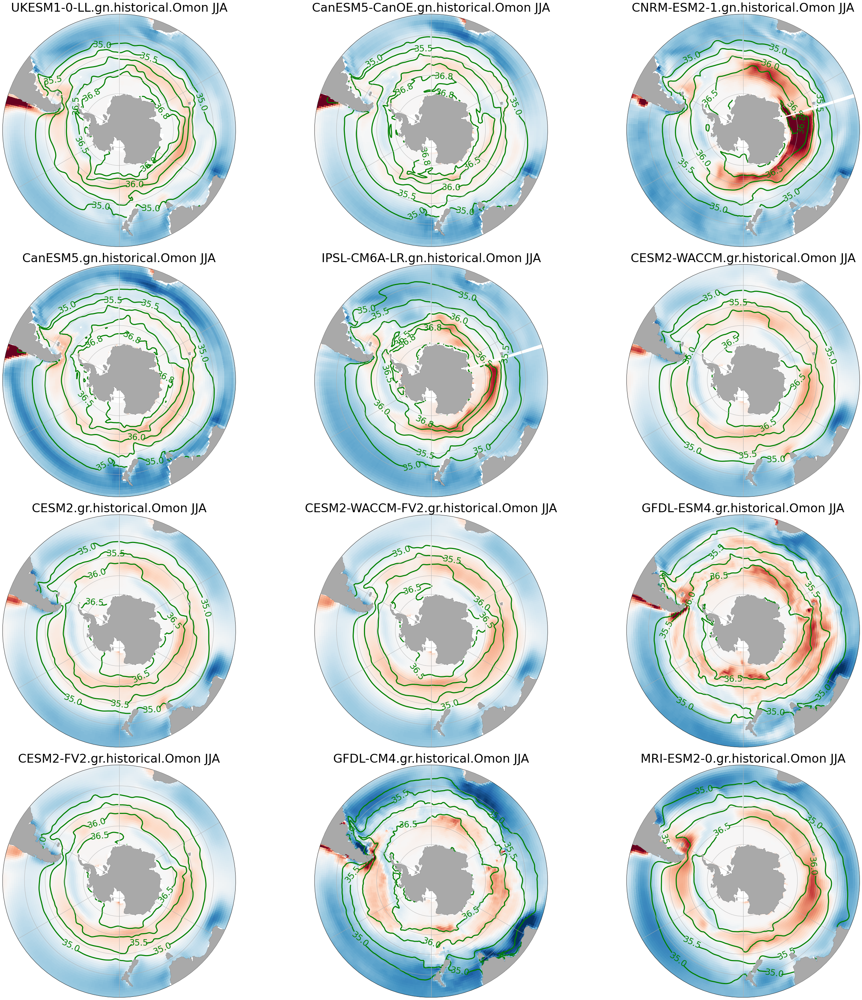

In [9]:
fig, axarr = plt.subplots(nrows = 4, ncols=3, figsize=[40,40], subplot_kw={'projection':ccrs.SouthPolarStereo()})
fig.tight_layout(pad = 5)
crs_plot = ccrs.SouthPolarStereo()
crs_source = ccrs.PlateCarree()

ax_idx = 0 # index for your axes array
for name, ds in dd.items():

    ax = axarr.flat[ax_idx]
    #fig,ax = plt.subplots(figsize=(10,10),subplot_kw={'projection':crs_plot})
    ax.add_feature(cfeature.LAND,zorder=10,facecolor='darkgray')
    ax.set_extent([-180, 180, -90, -30], crs_source)
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    ax.gridlines()
    ax.coastlines()
    
    title=name + ' JJA'
    ax.set_title(title,fontsize=34,pad = 1)
    
    lat = ds['fgco2'].lat.transpose('y','x')
    lon = ds['fgco2'].lon.transpose('y','x')
    X = lon
    Y = lat
    
    conversion = 3.1536e7 * 83.3
    # 3.1536e7 seconds per year
    # 83.3 mol C per kg -- 12 gC/mol
    
    Z = ds['fgco2']*conversion
    rho = ds['sigma2'].isel(lev = 0)
    rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
# #     rho = rho.transpose('y','x')
# #     print(Z)
# #     print(rho)
    
    
    im = ax.pcolormesh(X,Y,-1*Z,cmap='RdBu_r', transform = crs_source, shading = 'auto', vmin = -5, vmax = 5)
    if name == 'UKESM1-0-LL.gn.historical.Omon' or name =='CanESM5-CanOE.gn.historical.Omon' or name =='CNRM-ESM2-1.gn.historical.Omon' or name == 'CanESM5.gn.historical.Omon' or name == 'IPSL-CM6A-LR.gn.historical.Omon':
        CS = ax.contour(rho.lon,rho.lat,rho,transform=crs_source,levels=[35, 35.5, 36, 36.5, 36.8],colors='g', linewidths = 3)
    else:
        CS = ax.contour(rho.lon.transpose('y','x'),rho.lat.transpose('y','x'),rho.transpose('y','x'),transform=crs_source,levels=[35, 35.5, 36, 36.5],colors='g', linewidths = 3)
    
#     cbar_label = 'Surface Upward Flux of Total CO\u2082 (mol/m\u00b2/yr)'
#     cbar = plt.colorbar(im,ax = ax, orientation='horizontal',fraction = 0.05, pad=0.05)
#     cbar.set_label(cbar_label, fontsize = 20)
#     cbar.ax.tick_params(labelsize=18)
    ax.clabel(CS, inline=1, fontsize=24)
    
    ax_idx += 1


<a list of 15 text.Text objects>

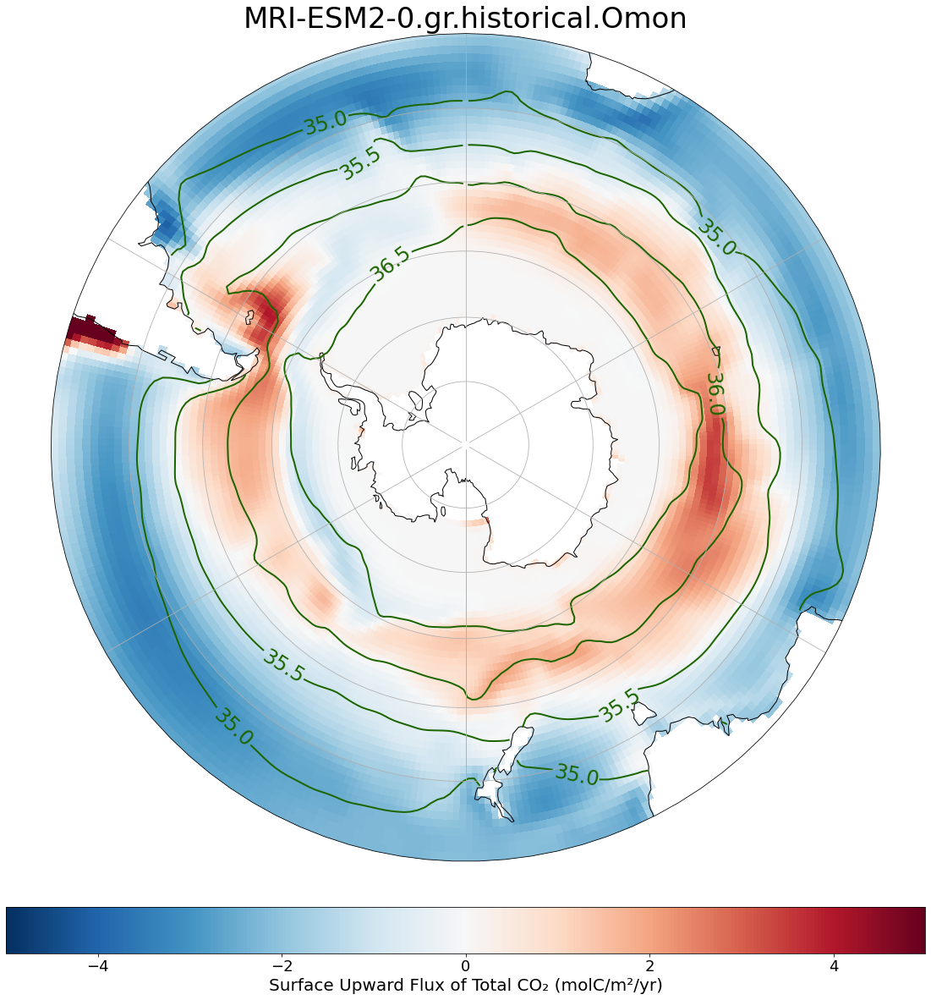

In [10]:
fig, ax = plt.subplots(nrows = 1, ncols=1, figsize=[20,20], subplot_kw={'projection':ccrs.SouthPolarStereo()})
crs_plot = ccrs.SouthPolarStereo()
crs_source = ccrs.PlateCarree()


ax.set_extent([-180, 180, -90, -30], crs_source)

    
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
    
ax.gridlines()
ax.coastlines()
    
title=name
ax.set_title(title,fontsize=34,pad = 1)
    
lat = ds['fgco2'].lat.transpose('y','x')
lon = ds['fgco2'].lon.transpose('y','x')
X = lon
Y = lat
    
conversion = 3.1536e7 * 83.3
    # 3.1536e7 seconds per year
    # 83.3 mol C per kg -- 12 gC/mol
    
Z = ds['fgco2']*conversion
rho = ds['sigma2'].isel(lev = 0)
rho = rho.transpose('x','y')

    
    
im = ax.pcolormesh(X,Y,-1*Z,cmap='RdBu_r', transform = crs_source, shading = 'auto', vmin = -5, vmax = 5)
if name == 'UKESM1-0-LL.gn.historical.Omon' or name =='CanESM5-CanOE.gn.historical.Omon' or name =='CNRM-ESM2-1.gn.historical.Omon' or name == 'CanESM5.gn.historical.Omon' or name == 'IPSL-CM6A-LR.gn.historical.Omon':
    CS = ax.contour(rho.lon,rho.lat,rho,transform=crs_source,levels=[35, 35.5, 36, 36.5],colors='#1d6500', linewidths = 2)
else:
    CS = ax.contour(rho.lon.transpose('y','x'),rho.lat.transpose('y','x'),rho.transpose('y','x'),transform=crs_source,levels=[35, 35.5, 36, 36.5],colors='#1d6500', linewidths = 2)
    
cbar_label = 'Surface Upward Flux of Total CO\u2082 (molC/m\u00b2/yr)'
cbar = plt.colorbar(im,ax = ax, orientation='horizontal',fraction = 0.05, pad=0.05)
cbar.set_label(cbar_label, fontsize = 20)
cbar.ax.tick_params(labelsize=18)
ax.clabel(CS, inline=1, fontsize=24)
    



# PCO2

<ipython-input-11-675f8710d75a>:16: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(ds['y'],ds['lev'], PCO2_x[name], vmin = 350, vmax = 600)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


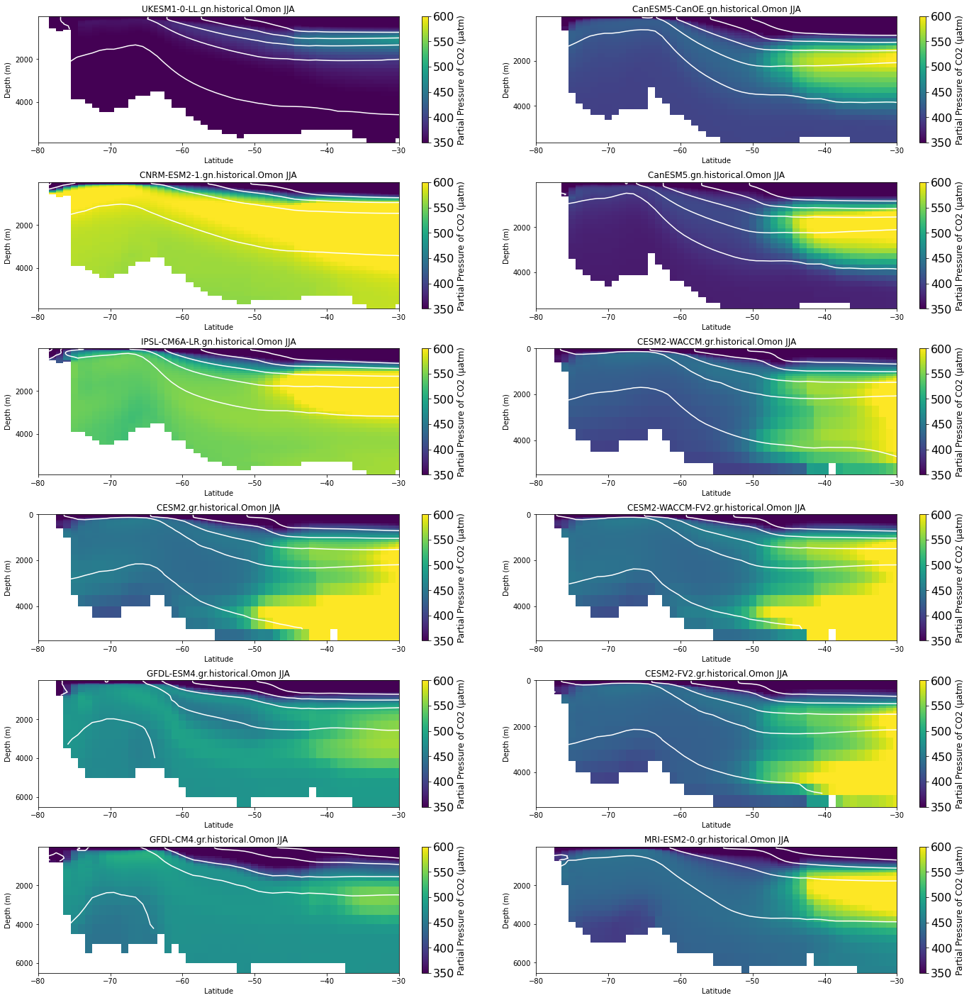

In [11]:
fig, axarr = plt.subplots(nrows = 6, ncols = 2, figsize=[20,20])
fig.tight_layout(pad = 3.5)
plt.rc('font', size = 16)
plt.rc('axes', titlesize= 12)    
plt.rc('axes', labelsize= 12)
plt.rc('figure', titlesize=16)

ax_idx = 0
for name, ds in dd_x.items():
    ax = axarr.flat[ax_idx]
    conversion =  1e6/1035
#     results = pyco2.sys(par1=ds['talk']*conversion,par2=ds['dissic']*conversion,par1_type=1,par2_type=2,
#                         pressure_out=0, temperature_out = ds['thetao'], pressure = ds['p'], 
#                         temperature = ds['insitutemp'])
    ax.set_xlim([-80,-30])
    im = ax.pcolormesh(ds['y'],ds['lev'], PCO2_x[name], vmin = 350, vmax = 600)
    CS = ax.contour(ds['y'],ds['lev'],ds['sigma2'],levels=[35.5, 36, 36.5, 36.8, 37], colors = 'w')
    cbar = plt.colorbar(im,ax=ax)
    ax.invert_yaxis()
    cbar.set_label('Partial Pressure of CO2 (\u03BCatm)')
    ax.set_title(name + ' JJA')
    ax.set_xlabel('Latitude')
    ax.set_ylabel('Depth (m)')
    ax_idx += 1

/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
<ipython-input-12-470c0e8bfb68>:31: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(ppco2['y'],ppco2['sigma2'], ppco2, vmin = 300, vmax = 600)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-pack

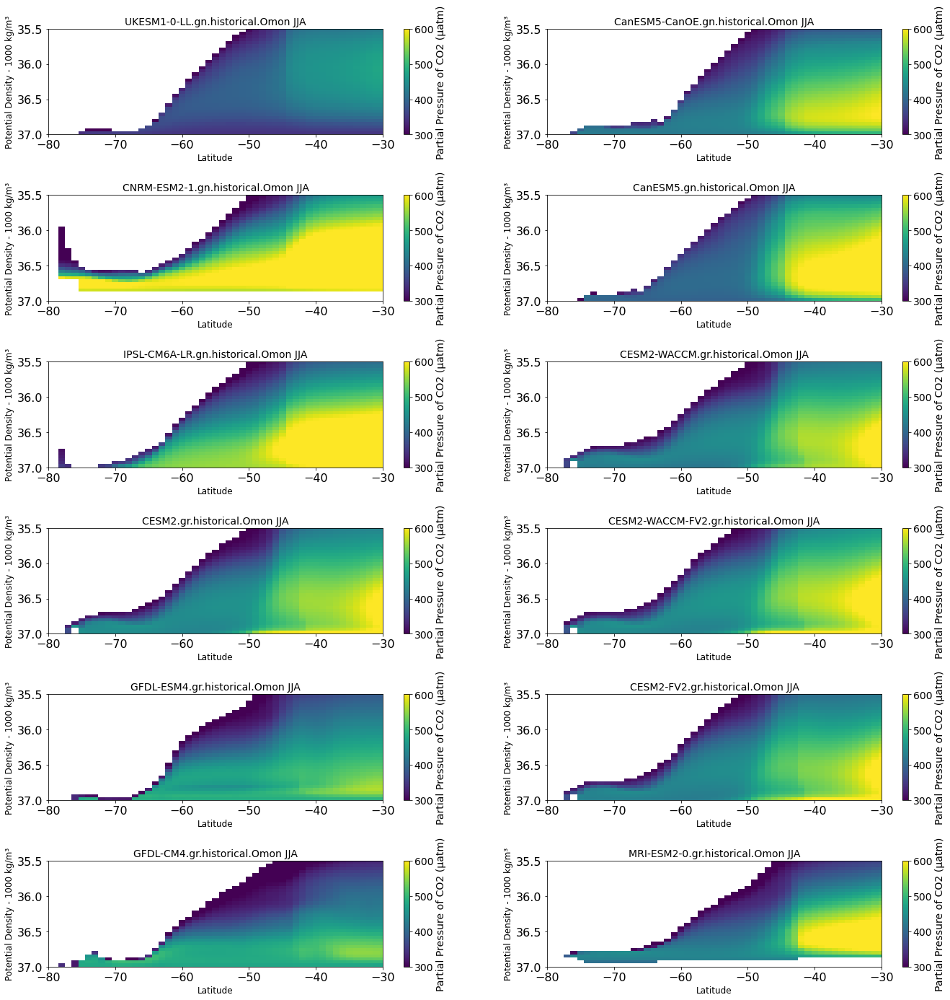

In [12]:
from xgcm import Grid

grid = Grid(ds, coords={'Z': {'center':'lev'}}, periodic=False)
target = np.linspace(35.5, 37, 35)

fig, axarr = plt.subplots(nrows = 6, ncols = 2, figsize=[20,20])
fig.tight_layout(pad = 3.5)
plt.rc('font', size = 14)
plt.rc('axes', titlesize= 14)    
plt.rc('axes', labelsize= 14)
plt.rc('figure', titlesize=16)

ax_idx = 0

for name, ds in dd_x.items():

    ax = axarr.flat[ax_idx]
    
    DIC = grid.transform(ds['dissic'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y')
    TALK = grid.transform(ds['talk'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y')
    THETAO = grid.transform(ds['thetao'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y')
    P = grid.transform(ds['p'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y')
    TEMP = grid.transform(ds['insitutemp'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y')
    conversion =  1e6/1035
    results = pyco2.sys(par1=TALK*conversion,par2=DIC*conversion,par1_type=1,par2_type=2,
                    pressure_out=0, temperature_out = THETAO, pressure = P, 
                    temperature = TEMP)

    ppco2 = DIC.copy(data=results['pCO2_out'])
    ax.set_xlim([-80,-30])
    im = ax.pcolormesh(ppco2['y'],ppco2['sigma2'], ppco2, vmin = 300, vmax = 600)
    cbar = plt.colorbar(im,ax=ax)
    cbar.set_label('Partial Pressure of CO2 (\u03BCatm)')
    ax.invert_yaxis()
    ax.set_title(name + ' JJA')
    ax.set_xlabel('Latitude')
    ax.set_ylabel('Potential Density - 1000 kg/m\u00b3')
    ax_idx += 1

In [136]:
np.where(ppco2[:,0:60] == ppco2[:,0:60].max())
ppco2[25,59]

<xarray.DataArray 'dissic' ()>
array(651.28014633)
Coordinates:
    y        float64 -30.5
    sigma2   float64 36.6

## PCO2 at 36.7 kg/m3

/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: Ru

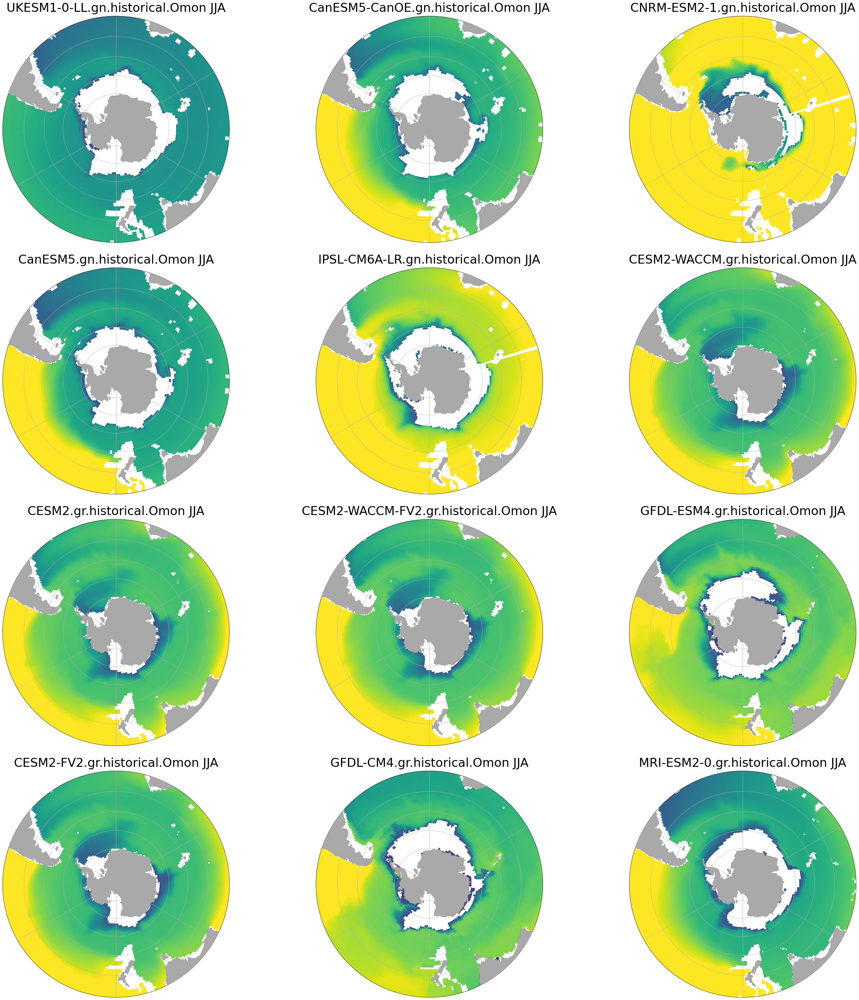

In [13]:


grid = Grid(ds, coords={'Z': {'center':'lev'}}, periodic=False)
target = np.linspace(35.5, 37, 10)

fig, axarr = plt.subplots(nrows = 4, ncols=3, figsize=[40,40], subplot_kw={'projection':ccrs.SouthPolarStereo()})
fig.tight_layout(pad = 5)
crs_plot = ccrs.SouthPolarStereo()
crs_source = ccrs.PlateCarree()

ax_idx = 0

for name, ds in dd.items():

    ax = axarr.flat[ax_idx]
    
    DIC = grid.transform(ds['dissic'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TALK = grid.transform(ds['talk'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    THETAO = grid.transform(ds['thetao'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    P = grid.transform(ds['p'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TEMP = grid.transform(ds['insitutemp'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    conversion =  1e6/1035
    results = pyco2.sys(par1=TALK*conversion,par2=DIC*conversion,par1_type=1,par2_type=2,
                    pressure_out=0, temperature_out = THETAO, pressure = P, 
                    temperature = TEMP)

    ppco2 = DIC.copy(data=results['pCO2_out'])

    ax = axarr.flat[ax_idx]
    ax.add_feature(cfeature.LAND,zorder=10,facecolor='darkgray')
    ax.set_extent([-180, 180, -90, -30], crs_source)
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    ax.gridlines()
    ax.coastlines()
    
    title=name + ' JJA'
    ax.set_title(title,fontsize=34,pad = 12)
    
    lat = ds['dissic'].lat.transpose('y','x')
    lon = ds['dissic'].lon.transpose('y','x')
    X = lon
    Y = lat
    
    conversion = 3.1536e7 * 22.72
    # 3.1536e7 seconds per year
    # 22.72 mol CO2 per kg -- 44.01 gCO2/mol
    Z = ppco2.sel(sigma2 = 36.7,method='nearest')
#     rho = gsw.sigma2(ds['so'].so.isel(lev = 16),ds['thetao'].thetao.isel(lev = 16))
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
# #     rho = rho.transpose('y','x')
# #     print(Z)
# #     print(rho)
    
    
    im = ax.pcolormesh(X,Y,Z,cmap='viridis', transform = crs_source, shading = 'auto', vmin = 200, vmax = 550)
    
#     cbar_label = 'Surface Upward Flux of Total CO\u2082 (mol/m\u00b2/yr)'
#     cbar = plt.colorbar(im,ax = ax, orientation='horizontal',fraction = 0.05, pad=0.05)
#     cbar.set_label(cbar_label, fontsize = 20)
#     cbar.ax.tick_params(labelsize=18)

    
    ax_idx += 1



## PCO2 at 36.8 kg/m3

/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: Ru

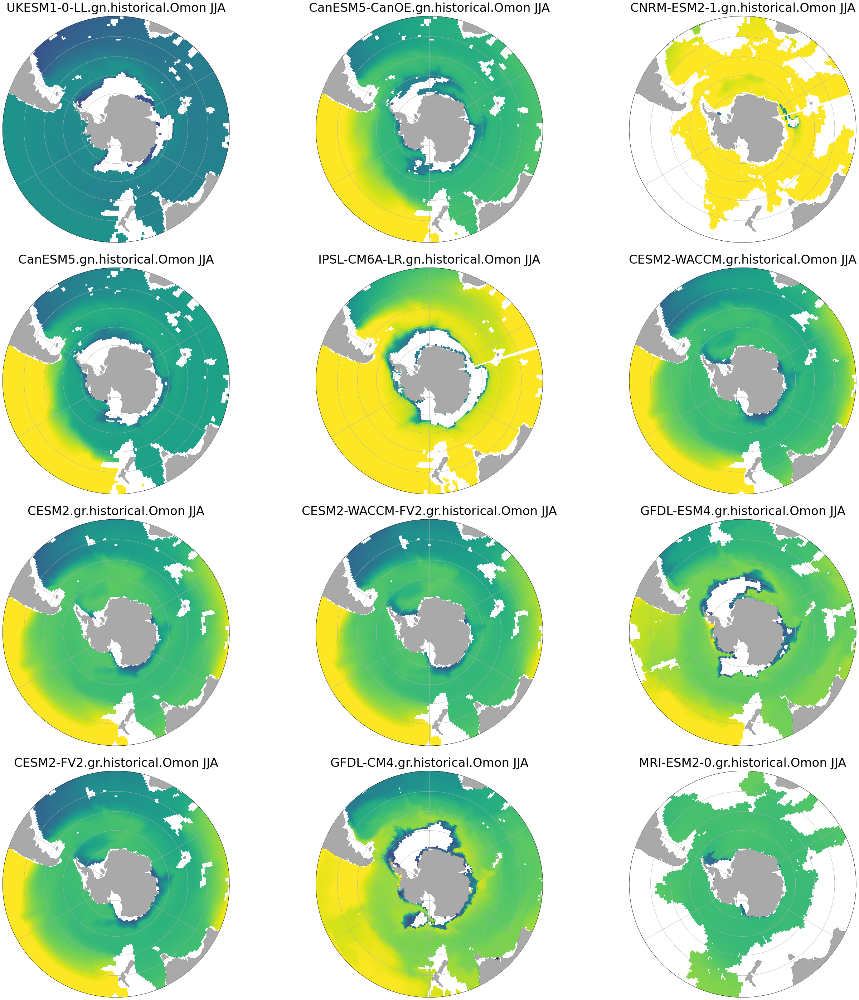

In [14]:


grid = Grid(ds, coords={'Z': {'center':'lev'}}, periodic=False)
target = np.linspace(35.5, 37, 10)

fig, axarr = plt.subplots(nrows = 4, ncols=3, figsize=[40,40], subplot_kw={'projection':ccrs.SouthPolarStereo()})
fig.tight_layout(pad = 5)
crs_plot = ccrs.SouthPolarStereo()
crs_source = ccrs.PlateCarree()

ax_idx = 0

for name, ds in dd.items():

    ax = axarr.flat[ax_idx]
    
    DIC = grid.transform(ds['dissic'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TALK = grid.transform(ds['talk'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    THETAO = grid.transform(ds['thetao'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    P = grid.transform(ds['p'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TEMP = grid.transform(ds['insitutemp'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    conversion =  1e6/1035
    results = pyco2.sys(par1=TALK*conversion,par2=DIC*conversion,par1_type=1,par2_type=2,
                    pressure_out=0, temperature_out = THETAO, pressure = P, 
                    temperature = TEMP)

    ppco2 = DIC.copy(data=results['pCO2_out'])

    ax = axarr.flat[ax_idx]
    ax.add_feature(cfeature.LAND,zorder=10,facecolor='darkgray')
    ax.set_extent([-180, 180, -90, -30], crs_source)
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    ax.gridlines()
    ax.coastlines()
    
    title=name + ' JJA'
    ax.set_title(title,fontsize=34,pad = 12)
    
    lat = ds['dissic'].lat.transpose('y','x')
    lon = ds['dissic'].lon.transpose('y','x')
    X = lon
    Y = lat
    
    conversion = 3.1536e7 * 22.72
    # 3.1536e7 seconds per year
    # 22.72 mol CO2 per kg -- 44.01 gCO2/mol
    Z = ppco2.sel(sigma2 = 36.8,method='nearest')
#     rho = gsw.sigma2(ds['so'].so.isel(lev = 16),ds['thetao'].thetao.isel(lev = 16))
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
# #     rho = rho.transpose('y','x')
# #     print(Z)
# #     print(rho)
    
    
    im = ax.pcolormesh(X,Y,Z,cmap='viridis', transform = crs_source, shading = 'auto', vmin = 200, vmax = 550)
    
#     cbar_label = 'Surface Upward Flux of Total CO\u2082 (mol/m\u00b2/yr)'
#     cbar = plt.colorbar(im,ax = ax, orientation='horizontal',fraction = 0.05, pad=0.05)
#     cbar.set_label(cbar_label, fontsize = 20)
#     cbar.ax.tick_params(labelsize=18)

    
    ax_idx += 1



## PCO2 at 36.6 kg/m3

/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: Ru

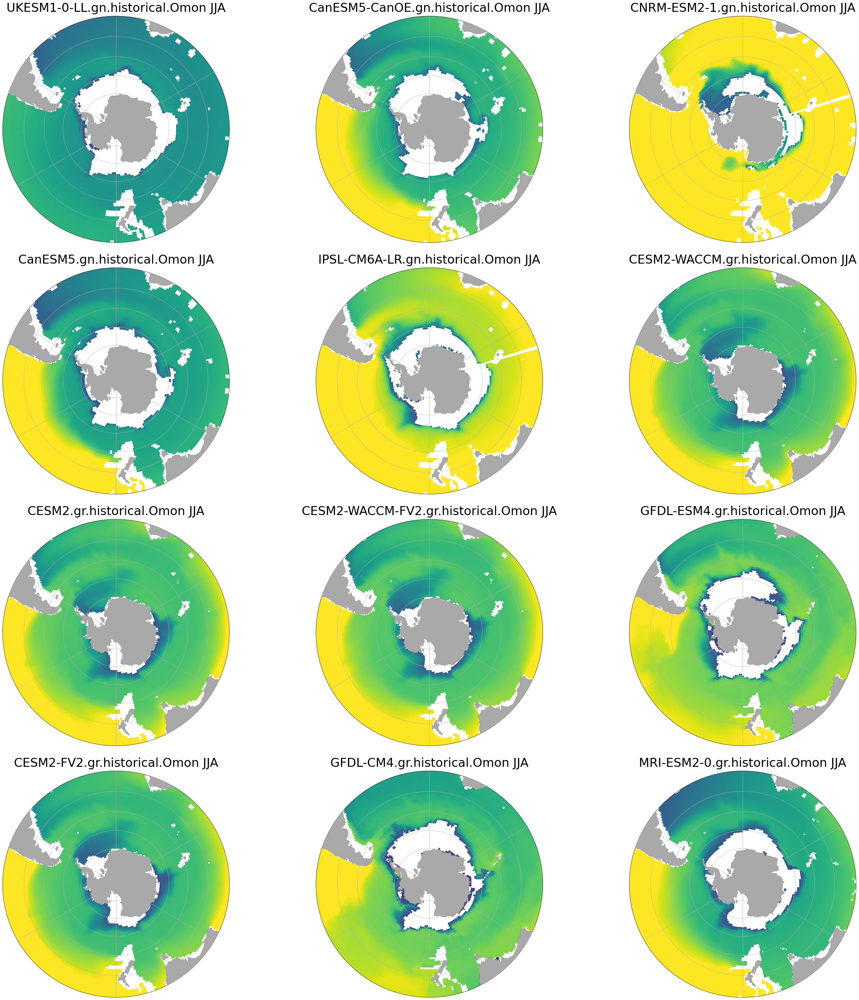

In [15]:


grid = Grid(ds, coords={'Z': {'center':'lev'}}, periodic=False)
target = np.linspace(35.5, 37, 10)

fig, axarr = plt.subplots(nrows = 4, ncols=3, figsize=[40,40], subplot_kw={'projection':ccrs.SouthPolarStereo()})
fig.tight_layout(pad = 5)
crs_plot = ccrs.SouthPolarStereo()
crs_source = ccrs.PlateCarree()

ax_idx = 0

for name, ds in dd.items():

    ax = axarr.flat[ax_idx]
    
    DIC = grid.transform(ds['dissic'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TALK = grid.transform(ds['talk'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    THETAO = grid.transform(ds['thetao'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    P = grid.transform(ds['p'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TEMP = grid.transform(ds['insitutemp'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    conversion =  1e6/1035
    results = pyco2.sys(par1=TALK*conversion,par2=DIC*conversion,par1_type=1,par2_type=2,
                    pressure_out=0, temperature_out = THETAO, pressure = P, 
                    temperature = TEMP)

    ppco2 = DIC.copy(data=results['pCO2_out'])

    ax = axarr.flat[ax_idx]
    ax.add_feature(cfeature.LAND,zorder=10,facecolor='darkgray')
    ax.set_extent([-180, 180, -90, -30], crs_source)
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    ax.gridlines()
    ax.coastlines()
    
    title=name + ' JJA'
    ax.set_title(title,fontsize=34,pad = 12)
    
    lat = ds['dissic'].lat.transpose('y','x')
    lon = ds['dissic'].lon.transpose('y','x')
    X = lon
    Y = lat
    
    conversion = 3.1536e7 * 22.72
    # 3.1536e7 seconds per year
    # 22.72 mol CO2 per kg -- 44.01 gCO2/mol
    Z = ppco2.sel(sigma2 = 36.6,method='nearest')
#     rho = gsw.sigma2(ds['so'].so.isel(lev = 16),ds['thetao'].thetao.isel(lev = 16))
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
# #     rho = rho.transpose('y','x')
# #     print(Z)
# #     print(rho)
    
    
    im = ax.pcolormesh(X,Y,Z,cmap='viridis', transform = crs_source, shading = 'auto', vmin = 200, vmax = 550)
    
#     cbar_label = 'Surface Upward Flux of Total CO\u2082 (mol/m\u00b2/yr)'
#     cbar = plt.colorbar(im,ax = ax, orientation='horizontal',fraction = 0.05, pad=0.05)
#     cbar.set_label(cbar_label, fontsize = 20)
#     cbar.ax.tick_params(labelsize=18)

    
    ax_idx += 1



# PCO2 at 36

/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: Ru

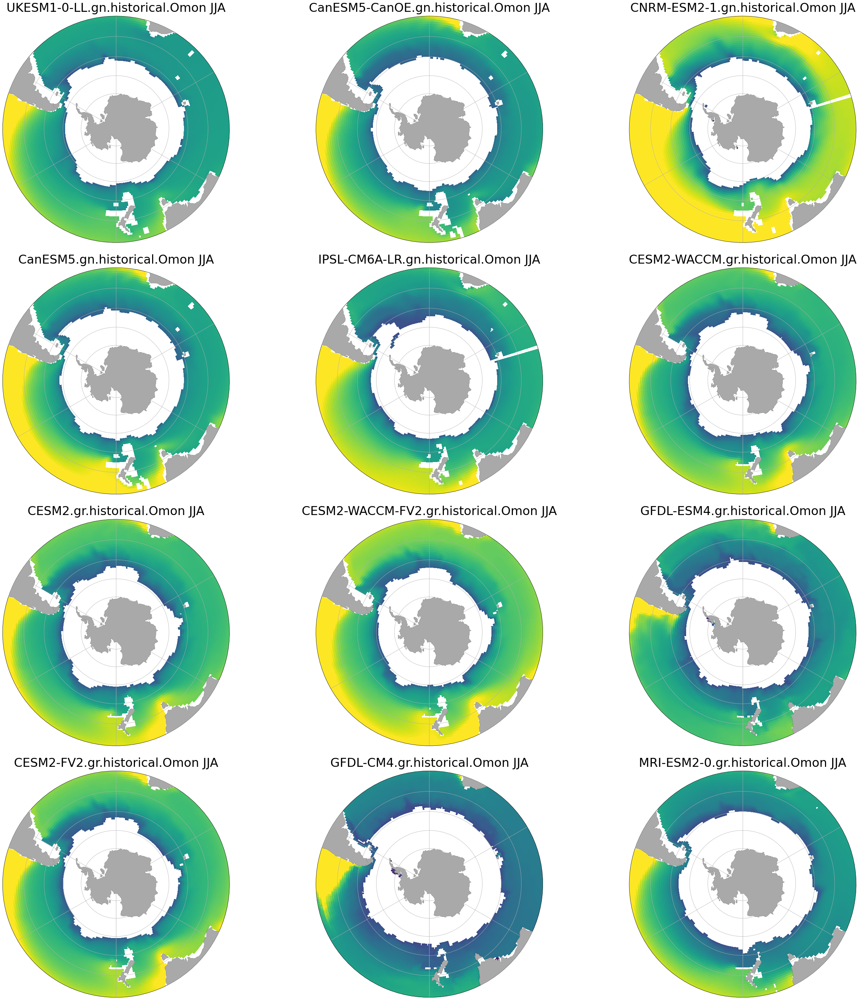

In [16]:


grid = Grid(ds, coords={'Z': {'center':'lev'}}, periodic=False)
target = np.linspace(35.5, 37, 10)

fig, axarr = plt.subplots(nrows = 4, ncols=3, figsize=[40,40], subplot_kw={'projection':ccrs.SouthPolarStereo()})
fig.tight_layout(pad = 5)
crs_plot = ccrs.SouthPolarStereo()
crs_source = ccrs.PlateCarree()

ax_idx = 0

for name, ds in dd.items():

    ax = axarr.flat[ax_idx]
    
    DIC = grid.transform(ds['dissic'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TALK = grid.transform(ds['talk'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    THETAO = grid.transform(ds['thetao'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    P = grid.transform(ds['p'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TEMP = grid.transform(ds['insitutemp'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    conversion =  1e6/1035
    results = pyco2.sys(par1=TALK*conversion,par2=DIC*conversion,par1_type=1,par2_type=2,
                    pressure_out=0, temperature_out = THETAO, pressure = P, 
                    temperature = TEMP)

    ppco2 = DIC.copy(data=results['pCO2_out'])

    ax = axarr.flat[ax_idx]
    ax.add_feature(cfeature.LAND,zorder=10,facecolor='darkgray')
    ax.set_extent([-180, 180, -90, -30], crs_source)
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    ax.gridlines()
    ax.coastlines()
    
    title=name + ' JJA'
    ax.set_title(title,fontsize=34,pad = 12)
    
    lat = ds['dissic'].lat.transpose('y','x')
    lon = ds['dissic'].lon.transpose('y','x')
    X = lon
    Y = lat
    
    conversion = 3.1536e7 * 22.72
    # 3.1536e7 seconds per year
    # 22.72 mol CO2 per kg -- 44.01 gCO2/mol
    Z = ppco2.sel(sigma2 = 36,method='nearest')
#     rho = gsw.sigma2(ds['so'].so.isel(lev = 16),ds['thetao'].thetao.isel(lev = 16))
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
# #     rho = rho.transpose('y','x')
# #     print(Z)
# #     print(rho)
    
    
    im = ax.pcolormesh(X,Y,Z,cmap='viridis', transform = crs_source, shading = 'auto', vmin = 200, vmax = 550)
    
#     cbar_label = 'Surface Upward Flux of Total CO\u2082 (mol/m\u00b2/yr)'
#     cbar = plt.colorbar(im,ax = ax, orientation='horizontal',fraction = 0.05, pad=0.05)
#     cbar.set_label(cbar_label, fontsize = 20)
#     cbar.ax.tick_params(labelsize=18)

    
    ax_idx += 1



/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: Ru

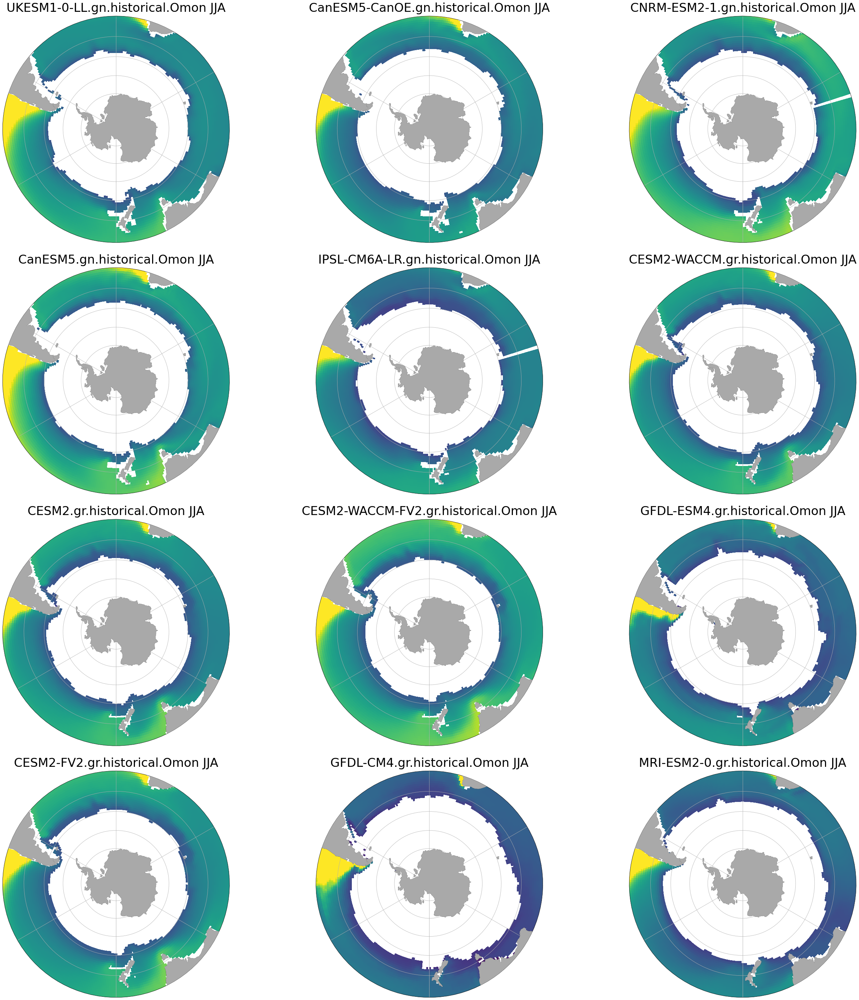

In [17]:


grid = Grid(ds, coords={'Z': {'center':'lev'}}, periodic=False)
target = np.linspace(35.5, 37, 10)

fig, axarr = plt.subplots(nrows = 4, ncols=3, figsize=[40,40], subplot_kw={'projection':ccrs.SouthPolarStereo()})
fig.tight_layout(pad = 5)
crs_plot = ccrs.SouthPolarStereo()
crs_source = ccrs.PlateCarree()

ax_idx = 0

for name, ds in dd.items():

    ax = axarr.flat[ax_idx]
    
    DIC = grid.transform(ds['dissic'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TALK = grid.transform(ds['talk'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    THETAO = grid.transform(ds['thetao'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    P = grid.transform(ds['p'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TEMP = grid.transform(ds['insitutemp'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    conversion =  1e6/1035
    results = pyco2.sys(par1=TALK*conversion,par2=DIC*conversion,par1_type=1,par2_type=2,
                    pressure_out=0, temperature_out = THETAO, pressure = P, 
                    temperature = TEMP)

    ppco2 = DIC.copy(data=results['pCO2_out'])

    ax = axarr.flat[ax_idx]
    ax.add_feature(cfeature.LAND,zorder=10,facecolor='darkgray')
    ax.set_extent([-180, 180, -90, -30], crs_source)
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    ax.gridlines()
    ax.coastlines()
    
    title=name + ' JJA'
    ax.set_title(title,fontsize=34,pad = 12)
    
    lat = ds['dissic'].lat.transpose('y','x')
    lon = ds['dissic'].lon.transpose('y','x')
    X = lon
    Y = lat
    
    conversion = 3.1536e7 * 22.72
    # 3.1536e7 seconds per year
    # 22.72 mol CO2 per kg -- 44.01 gCO2/mol
    Z = ppco2.sel(sigma2 = 35.5,method='nearest')
#     rho = gsw.sigma2(ds['so'].so.isel(lev = 16),ds['thetao'].thetao.isel(lev = 16))
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
# #     rho = rho.transpose('y','x')
# #     print(Z)
# #     print(rho)
    
    
    im = ax.pcolormesh(X,Y,Z,cmap='viridis', transform = crs_source, shading = 'auto', vmin = 200, vmax = 550)
    
#     cbar_label = 'Surface Upward Flux of Total CO\u2082 (mol/m\u00b2/yr)'
#     cbar = plt.colorbar(im,ax = ax, orientation='horizontal',fraction = 0.05, pad=0.05)
#     cbar.set_label(cbar_label, fontsize = 20)
#     cbar.ax.tick_params(labelsize=18)

    
    ax_idx += 1



# Things that require area: line plots and histograms of fgco2

In [19]:
A = dd_gr['GFDL-ESM4.gr.historical.Ofx'].mean([ 'x'],keep_attrs=True).areacello
A

<xarray.DataArray 'areacello' (y: 180)>
dask.array<mean_agg-aggregate, shape=(180,), dtype=float32, chunksize=(180,), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
Attributes:
    cell_methods:   area: sum
    comment:        Model data on the 1x1 grid includes values in all cells f...
    interp_method:  conserve_order1
    long_name:      Grid-Cell Area
    original_name:  areacello
    standard_name:  cell_area
    units:          m²

/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.

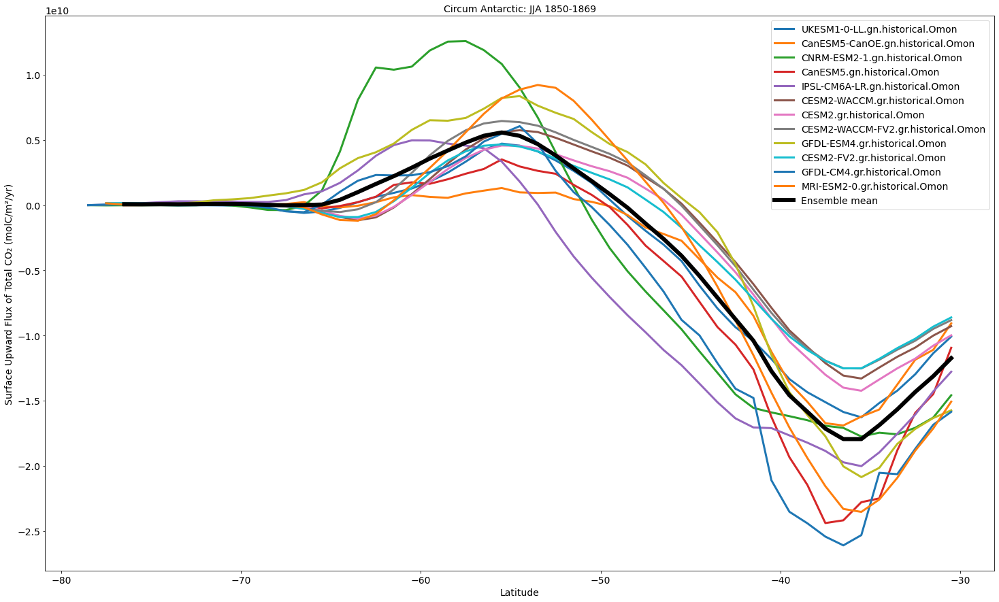

In [22]:
# d = dd['GFDL-CM4.gr.historical.Omon'].fgco2.mean(['x'],keep_attrs=True)
# d*A
temp = {}

conversion = 3.1536e7 * 83.3
for name, ds in dd.items():
    d = -1*ds.fgco2.mean(['x'],keep_attrs=True)*conversion
    ar = d*A
    temp[name]=ar
    

for name, ds in temp.items():
    plt.plot(ds.y[10:60], ds[10:60], label = name, lw = 3)
    plt.xlabel('Latitude')
    plt.ylabel('Surface Upward Flux of Total CO\u2082 (molC/m\u00b2/yr)')
    
mn = np.mean(list(temp.values()), axis=0)
plt.plot(ds.y[10:60], mn[10:60], lw = 6, label = 'Ensemble mean', color = 'black')
plt.xlabel('Latitude')
plt.ylabel('Surface Upward Flux of Total CO\u2082 (molC/m\u00b2/yr)')
# zr = xr.zeros_like(dd['CESM2-FV2.gr.historical.Omon'].fgco2)
# zr.isel(x = 0)[10:60].plot(linestyle = 'dashed', color = 'black')
# plt.xlabel('Latitude')
# plt.ylabel('Surface Upward Flux of Total CO\u2082 * Area (molC/yr)')

plt.legend(
#     bbox_to_anchor=(1.05, 1), 
    loc='upper right'
#     , borderaxespad=0.
)
plt.title('Circum Antarctic: JJA 1850-1869')
plt.rcParams["figure.figsize"] = (25,15)

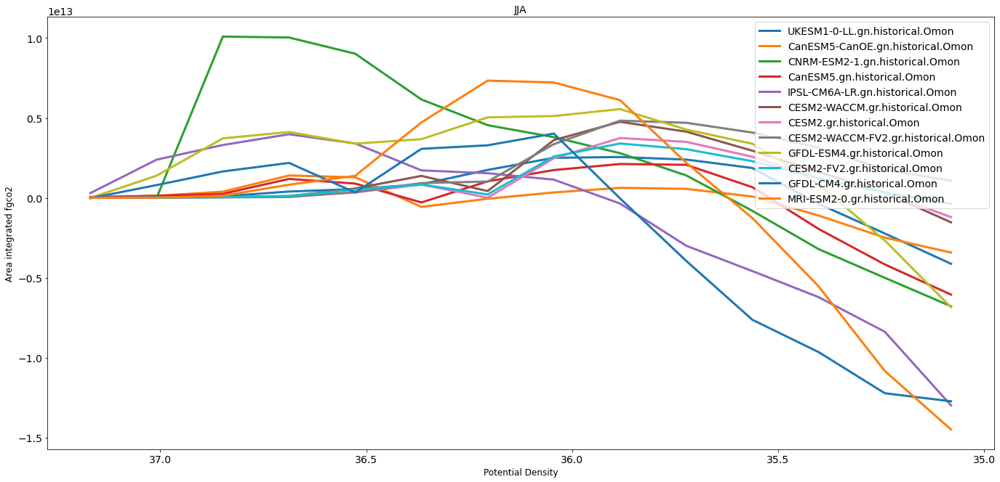

In [25]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize=[20,10])
fig.tight_layout(pad = 3.5)
plt.rc('font', size = 14)
plt.rc('axes', titlesize= 14)    
plt.rc('axes', labelsize= 12)
plt.rc('figure', titlesize=16)

target = np.linspace(35, 37.25, 15)
binz = np.linspace(35, 37.25, 15)

conversion = 3.1536e7 * 83.3
ax_idx = 0
# for name, ds in dd.items():
for name, ds in dd.items():
#     ax = axarr.flat[ax_idx]
#     if name != 'GFDL-ESM4.gr.historical.Omon':
#         if name != 'GFDL-CM4.gr.historical.Omon':
    h2 = histogram(ds['sigma2'].isel(lev = 0)[10:60], bins = [binz], weights = -1*ds.fgco2[10:60]*A[10:60]*conversion) 
    h2.plot(label = name, lw = 3)
ax.invert_xaxis()
ax.set_title('JJA')
ax.set_xlabel('Potential Density')
ax.set_ylabel('Area integrated fgco2')
#     ax.set_title(name)
#     ax_idx += 1
plt.legend(
#     bbox_to_anchor=(1.05, 1), 
    loc='upper right'
#     , borderaxespad=0.
)